In [1]:
# importing all the necessary libraries
'''' The main intent to inculcate this approach to the image classification is because to
handel all the features which are always hidden in cnn layers while tring to figure out what 
would have happened inside those layers which is never letting their accuracy increase on 
how many number of attempts made to hypertune the model. Whereas this allowed to look through 
all the features extracted to classify the model''''

import tensorflow
from tensorflow import keras
from keras import Sequential
from tensorflow.keras import layers, models, optimizers, callbacks
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import numpy as np

## Step 1: Data Collection and Preprocessing:

In [2]:
import os
from PIL import Image


IMAGE_SIZE = (224, 224)  


data_dir = '/kaggle/input/wec-intelligence-sig-2024-recruitment-task-cv/train_images/train_images'  # Main directory containing 'fake' and 'real' folders
categories = ['fake_train', 'real_train']


data = []
labels = []


for category in categories:
    folder_path = os.path.join(data_dir, category)
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        try:
            img = Image.open(file_path).convert('RGB').resize(IMAGE_SIZE)
            img_array = np.array(img).flatten() 
            data.append(img_array)
            labels.append(0 if category == 'fake_train' else 1)  
        except Exception as e:
            print(f"Could not process image {file_path}: {e}")


In [3]:
data = np.array(data)  
labels = np.array(labels)

var1 = np.shape(data)
var2 =np.shape(labels)
print(f"data: {data} \n and shape of the data: {var1}\n\n labels: {labels}\n and shape of the labels:{var2}")

data: [[231 238 243 ... 102  81  70]
 [ 96  77  52 ... 161 158  75]
 [ 73  73  55 ...  64  64  47]
 ...
 [195 185 183 ...  26  23  30]
 [195 181 175 ... 197 185 187]
 [ 47   8  10 ...  79  24  26]] 
 and shape of the data: (1600, 150528)

 labels: [0 0 0 ... 1 1 1]
 and shape of the labels:(1600,)


AxesImage(size=(224, 224))


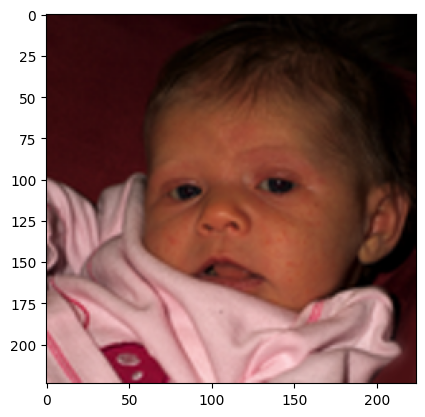

In [4]:
print(plt.imshow(img))

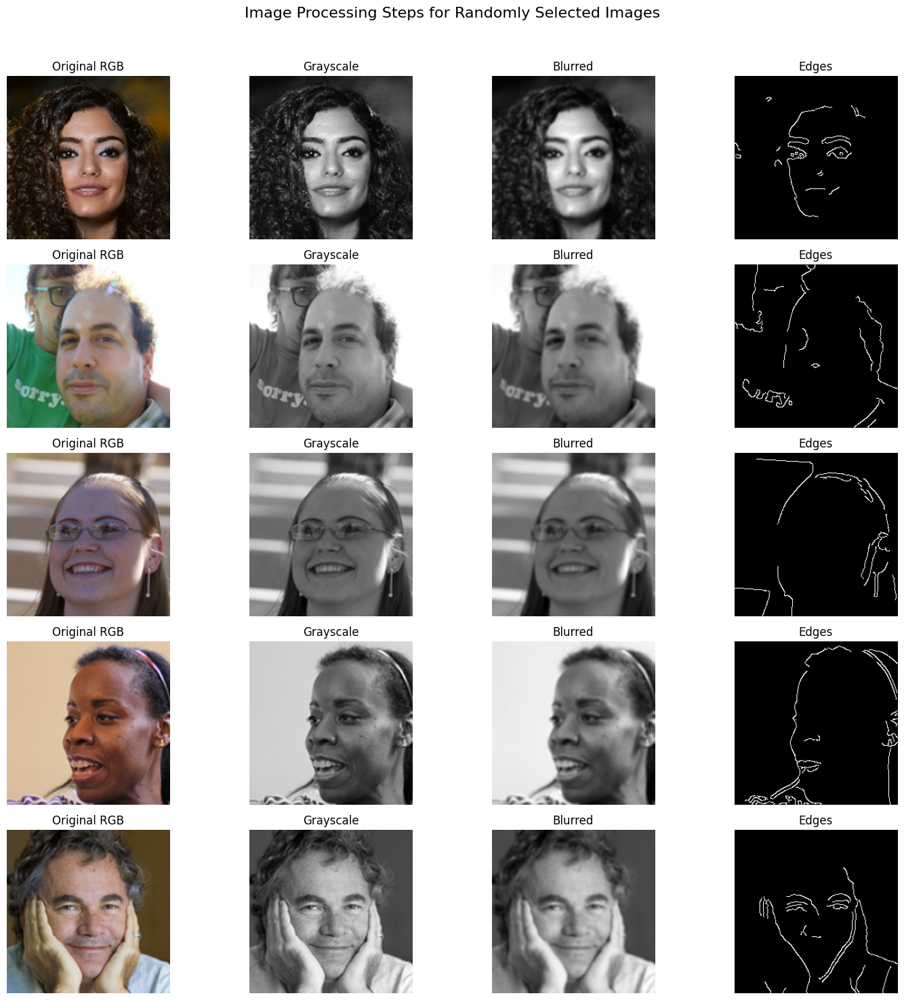

In [5]:
'''' canny_edge_detection == Canny edge detection identifies prominent edges and outlines, 
which can reveal inconsistencies or unnatural boundaries often present in fake images. 
It enhances edge clarity to detect anomalies, such as unnatural smoothness or sharp transitions that indicate manipulation. 
This feature aids in distinguishing authentic texture and structure from artificially generated or modified regions.''''

import cv2
import random
import numpy as np
import matplotlib.pyplot as plt


IMAGE_SIZE = (224, 224)  


edges = []
for img_array in data:
    img_rgb = img_array.reshape(IMAGE_SIZE[1], IMAGE_SIZE[0], 3)
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 1.4)
    img_edges = cv2.Canny(img_blur, 100, 200)
    edges.append(img_edges)


sample_indices = random.sample(range(len(data)), 5)


fig, axes = plt.subplots(len(sample_indices), 4, figsize=(15, 15))
fig.suptitle("Image Processing Steps for Randomly Selected Images", fontsize=16)

for row, i in enumerate(sample_indices):
    img_array = data[i]

    # Step 1: Reshape the flattened image back to RGB format
    img_rgb = img_array.reshape(IMAGE_SIZE[1], IMAGE_SIZE[0], 3)
    axes[row, 0].imshow(img_rgb)
    axes[row, 0].set_title("Original RGB")
    axes[row, 0].axis("off")

    # Step 2: Convert RGB to Grayscale
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    axes[row, 1].imshow(img_gray, cmap="gray")
    axes[row, 1].set_title("Grayscale")
    axes[row, 1].axis("off")

    # Step 3: Apply Gaussian Blur
    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 1.4)
    axes[row, 2].imshow(img_blur, cmap="gray")
    axes[row, 2].set_title("Blurred")
    axes[row, 2].axis("off")

    # Step 4: Display precomputed edges for the image
    axes[row, 3].imshow(edges[i], cmap="gray")
    axes[row, 3].set_title("Edges")
    axes[row, 3].axis("off")


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


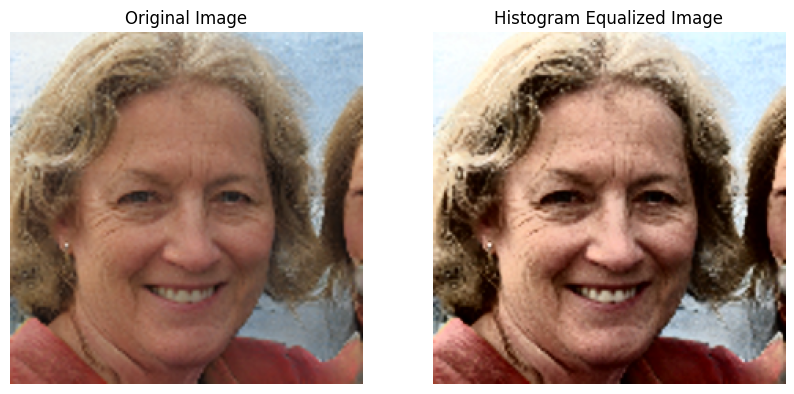

In [7]:
'''''Histogram equalization enhances the contrast in face images by distributing pixel intensities more evenly, 
making distinguishing features clearer. This adjustment highlights inconsistencies in texture, edges, 
and lighting that might indicate a fake image. Consequently, histogram-equalized images can reveal 
subtle artifacts or unnatural contrasts commonly present in fakes.'''''

data_reshaped = data.reshape(-1, 224, 224, 3).astype(np.uint8)  # Ensure it's in uint8 formats

equalized_data = np.empty_like(data_reshaped)


for i in range(data_reshaped.shape[0]):
    
    ycrcb_img = cv2.cvtColor(data_reshaped[i], cv2.COLOR_RGB2YCrCb)
    
    ycrcb_img[:, :, 0] = cv2.equalizeHist(ycrcb_img[:, :, 0])
    
    equalized_data[i] = cv2.cvtColor(ycrcb_img, cv2.COLOR_YCrCb2RGB)


sample_index = 0  
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(data_reshaped[sample_index])
plt.title("Original Image")
plt.axis("off")

# Histogram equalized image
plt.subplot(1, 2, 2)
plt.imshow(equalized_data[sample_index])
plt.title("Histogram Equalized Image")
plt.axis("off")

plt.show()


In [9]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(data_reshaped, labels, test_size=0.2, random_state=42)

print("Training data shape:", X_train.shape)
print("Validation data shape:", X_val.shape)
print("Training labels shape:", y_train.shape)
print("Validation labels shape:", y_val.shape)


Training data shape: (1280, 224, 224, 3)
Validation data shape: (320, 224, 224, 3)
Training labels shape: (1280,)
Validation labels shape: (320,)


## Step 2: **Feature Extraction**

In [10]:
''''' The Local Binary Pattern (LBP) histogram captures texture details by encoding pixel intensity differences in local neighborhoods. 
It reveals distinctive patterns of smoothness or roughness, which can help differentiate natural textures in real face images from artifacts 
often present in fake ones. By comparing these patterns, LBP aids in distinguishing subtle structural discrepancies.''''

from skimage.feature import local_binary_pattern

num_points = 8  
radius = 1  

def compute_lbp_histogram(image):
    """Compute the LBP histogram of a given grayscale image."""
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    lbp = local_binary_pattern(gray_image, num_points, radius, method='uniform')
    
    (hist, _) = np.histogram(lbp, bins=np.arange(0, num_points + 3), range=(0, num_points + 2))
    
    hist = hist.astype("float")
    hist /= hist.sum()
    
    return hist

X_train_lbp = np.array([compute_lbp_histogram(X_train[i].astype(np.uint8)) for i in range(X_train.shape[0])])

X_val_lbp = np.array([compute_lbp_histogram(X_val[i].astype(np.uint8)) for i in range(X_val.shape[0])])

print("LBP Features for Training data shape:", X_train_lbp.shape)
print("LBP Features for Validation data shape:", X_val_lbp.shape)


LBP Features for Training data shape: (1280, 10)
LBP Features for Validation data shape: (320, 10)


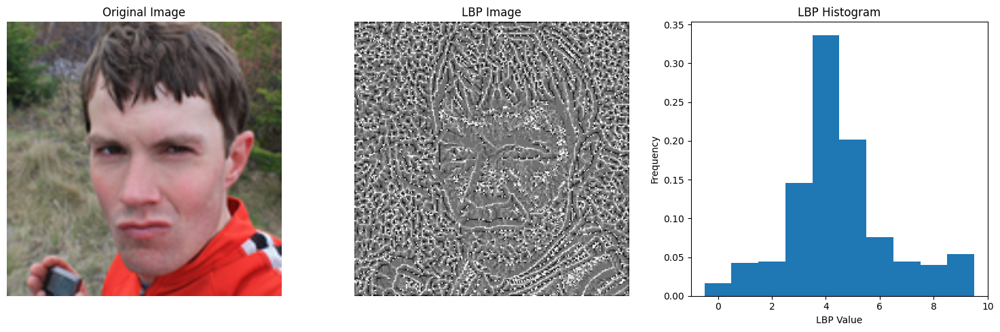

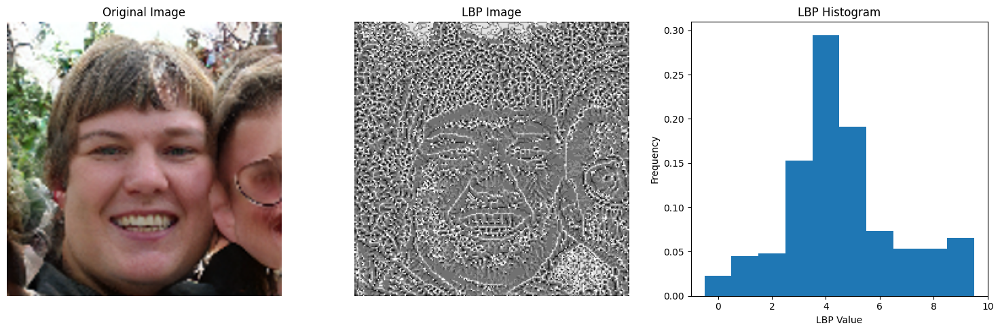

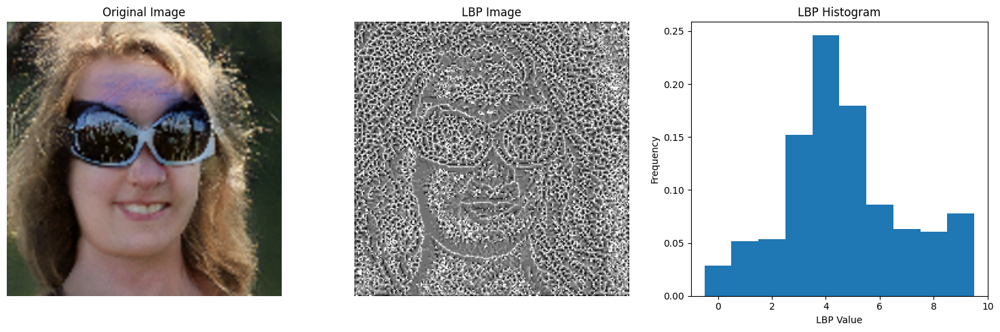

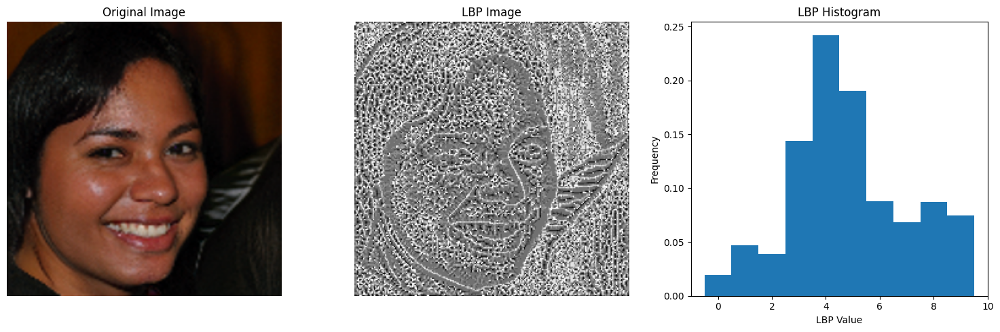

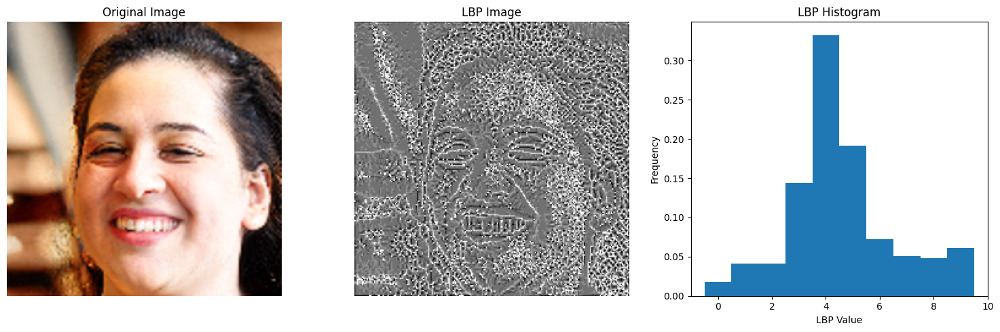

In [11]:
def visualize_lbp(image, lbp_histogram):
    """Visualizes the original image, LBP representation, and its histogram."""
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    lbp_image = local_binary_pattern(gray_image, num_points, radius, method='uniform')
    
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Original Image
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    # LBP Image
    ax[1].imshow(lbp_image, cmap='gray')
    ax[1].set_title('LBP Image')
    ax[1].axis('off')

    # LBP Histogram
    ax[2].bar(range(len(lbp_histogram)), lbp_histogram, width=1)
    ax[2].set_title('LBP Histogram')
    ax[2].set_xlabel('LBP Value')
    ax[2].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()
    
for i in range(5):  
    visualize_lbp(X_train[i], X_train_lbp[i])

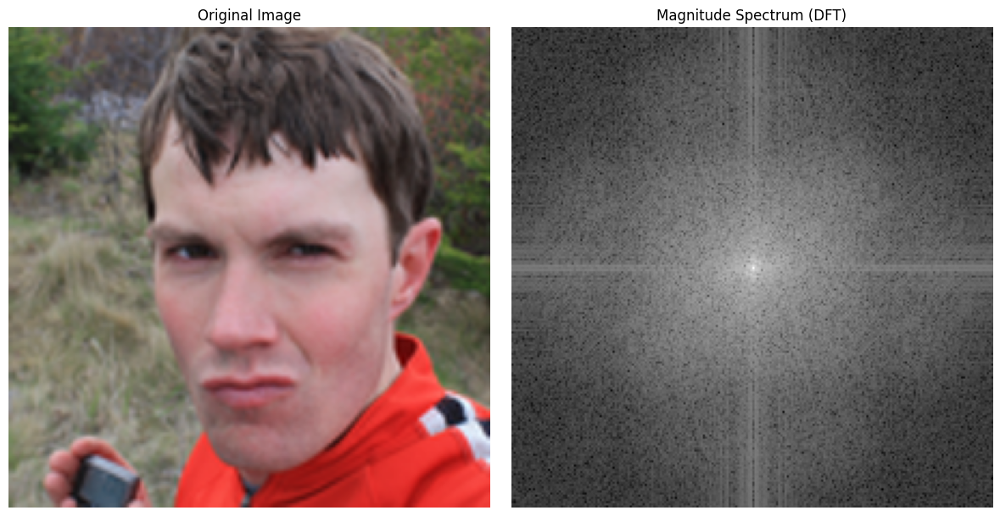

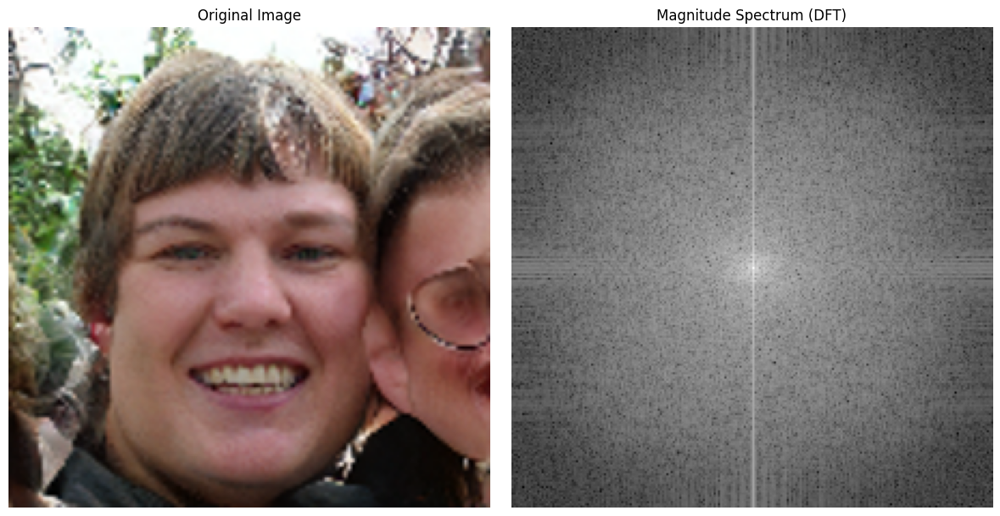

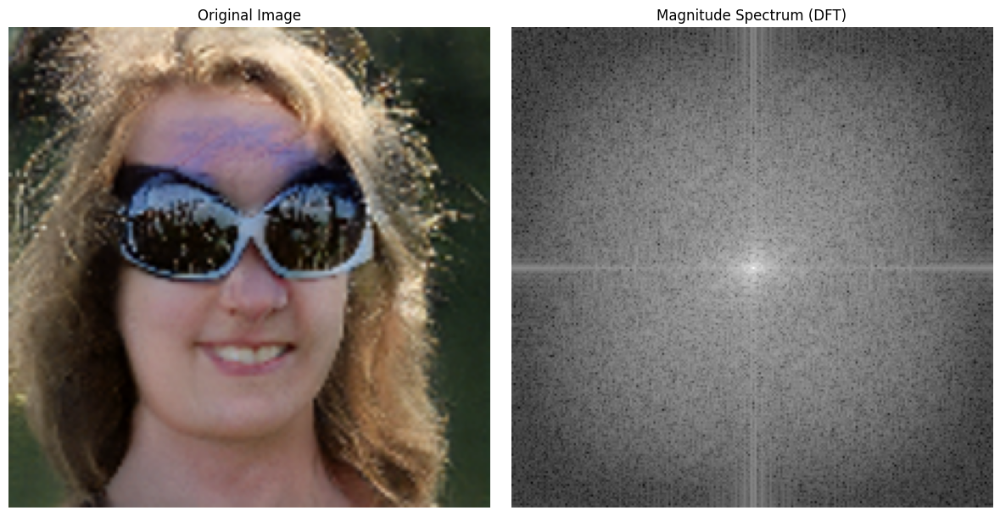

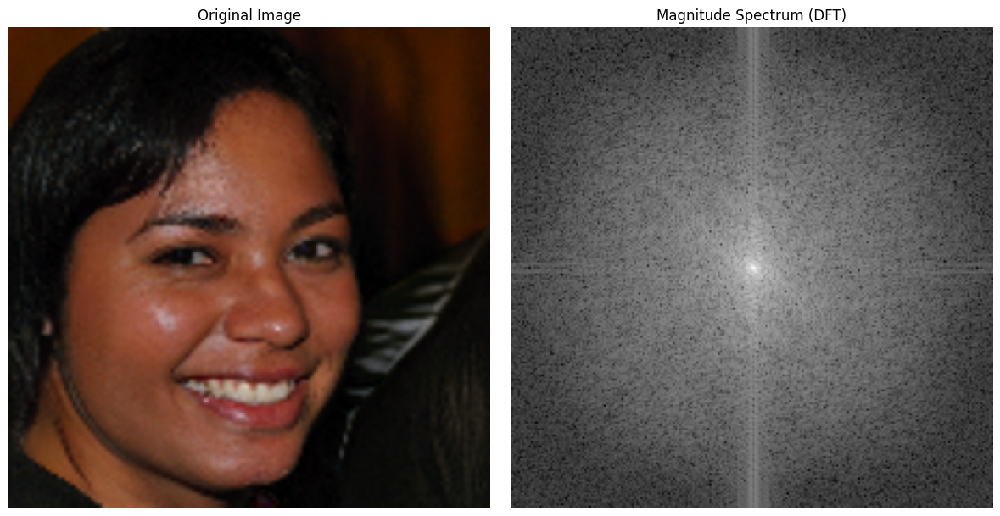

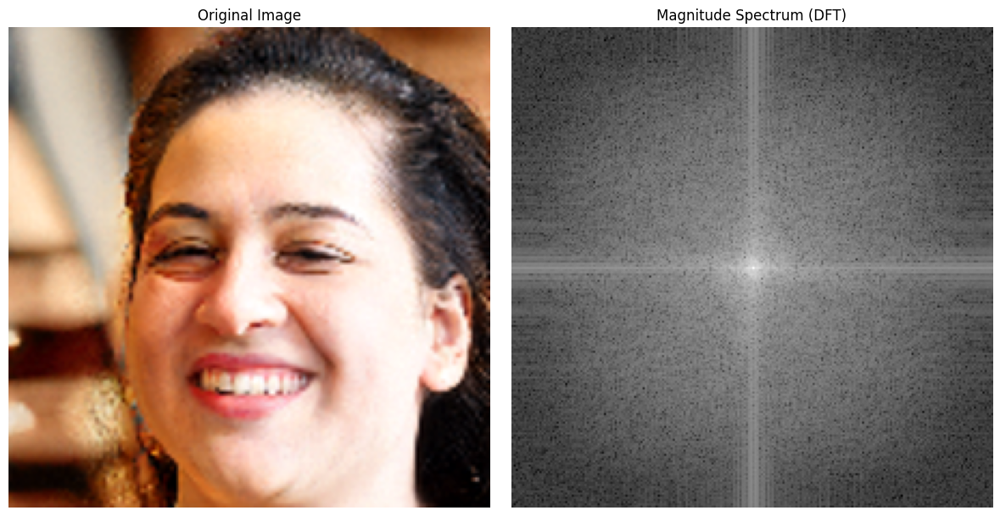

In [12]:
def compute_dft(image):
    """Compute and visualize the DFT of an image."""
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Compute DFT
    dft = cv2.dft(np.float32(gray_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)  

    # Compute magnitude spectrum
    magnitude_spectrum = cv2.magnitude(dft_shifted[:, :, 0], dft_shifted[:, :, 1])
    magnitude_spectrum = np.log(magnitude_spectrum + 1)  

    return gray_image, magnitude_spectrum

def visualize_dft(image, magnitude_spectrum):
    """Visualize the original image and its DFT magnitude spectrum."""
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(magnitude_spectrum, cmap='gray')
    ax[1].set_title('Magnitude Spectrum (DFT)')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()


for i in range(5):  
    gray_image, magnitude_spectrum = compute_dft(X_train[i].astype(np.uint8))
    visualize_dft(X_train[i], magnitude_spectrum)

(<matplotlib.image.AxesImage at 0x7f5648603f10>, (224, 224))

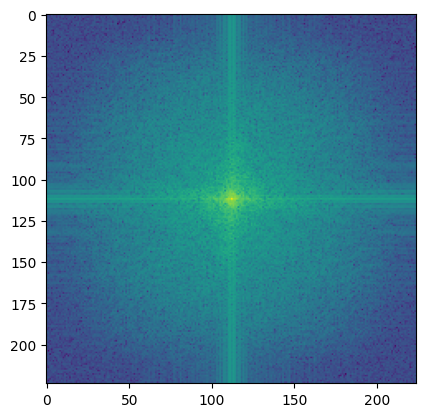

In [13]:
plt.imshow(magnitude_spectrum),np.shape(magnitude_spectrum)

## Step 3: **Model Selection and Implementation**

In [14]:
from sklearn import svm

edges = np.array(edges) if isinstance(edges, list) else edges
equalized_data = np.array(equalized_data) if isinstance(equalized_data, list) else equalized_data

def flatten_features(data):
    return data.reshape(data.shape[0], -1)

# Step 1: Prepare Features
edges_flat = flatten_features(edges)

equalized_data_flat = flatten_features(equalized_data)

def compute_dft_magnitude(images):
    dft_features = []
    for img in images:
        gray_img = cv2.cvtColor(img.reshape(224, 224, 3), cv2.COLOR_RGB2GRAY)
        dft = cv2.dft(np.float32(gray_img), flags=cv2.DFT_COMPLEX_OUTPUT)
        dft_shifted = np.fft.fftshift(dft)
        magnitude_spectrum = cv2.magnitude(dft_shifted[:, :, 0], dft_shifted[:, :, 1])
        magnitude_spectrum_log = np.log(magnitude_spectrum + 1)
        dft_features.append(magnitude_spectrum_log.flatten())
    return np.array(dft_features)

dft_train = compute_dft_magnitude(X_train)
dft_val = compute_dft_magnitude(X_val)

X_train_combined = np.hstack((edges_flat[:1280], equalized_data_flat[:1280], X_train_lbp, dft_train))
X_val_combined = np.hstack((edges_flat[1280:], equalized_data_flat[1280:], X_val_lbp, dft_val))

# Step 2: Train SVM Classifier
svm_classifier = svm.SVC(kernel="rbf", class_weight="balanced")
svm_classifier.fit(X_train_combined, y_train)


SVC(class_weight='balanced')

## Step 4: **Model Evaluation and Tuning**

F1 Score: 0.4595


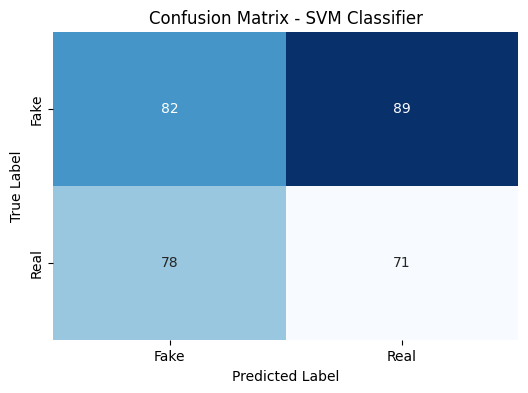

In [15]:
import seaborn as sns
from sklearn.metrics import f1_score, confusion_matrix

y_pred = svm_classifier.predict(X_val_combined)

# Step 3: Evaluate the Model
f1 = f1_score(y_val, y_pred)
print(f"F1 Score: {f1:.4f}")

# Plot Confusion Matrix Heatmap
conf_matrix = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Fake", "Real"], yticklabels=["Fake", "Real"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - SVM Classifier")
plt.show()
